#CSV analyzer for The New York Times

In [308]:
import math
import pickle
from datetime import datetime

import blaze
import matplotlib
import pandas as pd
from dateutil.relativedelta import relativedelta
from joblib import Parallel, delayed
from matplotlib import pyplot as plt
from pymongo import MongoClient

In [309]:
%matplotlib inline

In [310]:
matplotlib.rcParams['figure.max_open_warning'] = 300

In [311]:
import seaborn as sns

In [312]:
import numpy

def smooth(x,window_len=11,window='hanning'):
    """smooth the data using a window with requested size.
    
    This method is based on the convolution of a scaled window with the signal.
    The signal is prepared by introducing reflected copies of the signal 
    (with the window size) in both ends so that transient parts are minimized
    in the begining and end part of the output signal.
    
    input:
        x: the input signal 
        window_len: the dimension of the smoothing window; should be an odd integer
        window: the type of window from 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'
            flat window will produce a moving average smoothing.

    output:
        the smoothed signal
        
    example:

    t=linspace(-2,2,0.1)
    x=sin(t)+randn(len(t))*0.1
    y=smooth(x)
    
    see also: 
    
    numpy.hanning, numpy.hamming, numpy.bartlett, numpy.blackman, numpy.convolve
    scipy.signal.lfilter
 
    TODO: the window parameter could be the window itself if an array instead of a string
    NOTE: length(output) != length(input), to correct this: return y[(window_len/2-1):-(window_len/2)] instead of just y.
    """

    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")

    if x.size < window_len:
        raise ValueError ("Input vector needs to be bigger than window size.")


    if window_len<3:
        return x


    if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
        raise ValueError("Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")


    s=numpy.r_[x[window_len-1:0:-1],x,x[-1:-window_len:-1]]
    #print(len(s))
    if window == 'flat': #moving average
        w=numpy.ones(window_len,'d')
    else:
        w=eval('numpy.'+window+'(window_len)')

    y=numpy.convolve(w/w.sum(),s,mode='valid')
    return y[(window_len/2-1):-(window_len/2)]


## Data

In [4]:
total_data = pd.read_csv('../nytimes/rows.csv')

In [5]:
total_data.count()

article_id       1544383
pub_date         1544383
section_name     1544383
web_url          1544383
term_category    1544383
term             1544383
sentence         1544383
dtype: int64

In [6]:
total_data_dedup = total_data.drop_duplicates()

In [7]:
total_data_dedup.count()

article_id       1432978
pub_date         1432978
section_name     1432978
web_url          1432978
term_category    1432978
term             1432978
sentence         1432978
dtype: int64

In [8]:
list(total_data_dedup.term.value_counts().items())

[('executive', 296247),
 ('Become Inc', 283621),
 ('manager', 140885),
 ('founder', 81439),
 ('Indeed', 74720),
 ('at&t', 44971),
 ('apple', 40970),
 ('ford', 39614),
 ('twitter', 37697),
 ('Google', 35672),
 ('facebook', 34605),
 ('microsoft', 29673),
 ('Voices.com', 28494),
 ('Signal', 27596),
 ('general motors', 18827),
 ('amazon.com', 18529),
 ('wal-mart', 13781),
 ('entrepreneur', 13041),
 ('visa', 10721),
 ('walt disney company', 9578),
 ('intel corporation', 9208),
 ('boeing', 9075),
 ('ebay', 8978),
 ('coca-cola company', 8243),
 ('general electric', 8179),
 ('Exec', 6026),
 ('nike', 5425),
 ('samsung', 5229),
 ('exxon', 4721),
 ('BERG', 4352),
 ('omnicom group', 4260),
 ('netflix', 3928),
 ('johnson & johnson', 3432),
 ('morgan chase', 2909),
 ('berkshire hathaway', 2782),
 ('mckinsey & company', 2727),
 ('chevron', 2643),
 ('instagram', 2612),
 ('pepsico', 2558),
 ('cisco systems', 2547),
 ('pricewaterhousecoopers', 2527),
 ('halliburton company', 2319),
 ('Nordic', 2315),
 (

In [9]:
# Remove
remove_list = ['Become Inc', 'Indeed', 'at&t', 'Signal']

In [10]:
for term in remove_list:
    total_data_dedup = total_data_dedup[total_data_dedup['term'] != term]

In [11]:
total_data_dedup.count()

article_id       1002070
pub_date         1002070
section_name     1002070
web_url          1002070
term_category    1002070
term             1002070
sentence         1002070
dtype: int64

In [12]:
total_grouped = total_data_dedup.groupby(['article_id', 'term'])['sentence']

In [13]:
def indexes_to_delete(series):
    del_index_list = []
    for i1, s1 in series.items():
        for i2, s2 in series.items():
            if i1 != i2 and s1 in s2:
                del_index_list.append(i1)
                break
    return str(del_index_list)

In [5]:
grouped_indexes = total_grouped.aggregate({'indexes_to_delete': indexes_to_delete})

In [ ]:
remove_index_list = list(set(
    [index for index_list in grouped_indexes['indexes_to_delete'] for index in eval(index_list)]
))

In [ ]:
data = total_data_dedup.drop(remove_index_list)

In [ ]:
data.count()

In [ ]:
# df = pd.DataFrame([
#                 [1, 'hola', 'Hola mundo'],         # 0
#                 [1, 'nada', 'Nada que ver'],       # 1
#                 [1, 'hola', 'Hola mundo que tal'], # 2
#                 [1, 'hola', 'Hola'],               # 3
#                 [2, 'hola', 'Hola mundo'],         # 4
#                 [2, 'adios', 'Adios'],             # 5
#                 [3, 'adios', 'Adios'],             # 6
#                ], columns=['article_id', 'term', 'sentence'])
# # g = df.groupby(['article_id', 'term'])['sentence'].aggregate({'indexes_to_delete': indexes_to_delete})
# # l = list(set(
# #     [index for index_list in g['indexes_to_delete'] for index in eval(index_list)]
# # ))
# # df2 = df.drop(l)
# dd = blaze.Data(df)

In [ ]:
# blaze.by(blaze.merge(dd.article_id, dd.term),
#          total=dd.article_id.count()
#         )

In [ ]:
# Change categories: ebay; executive, manager; entrepreneur, founder, new venture, startup

data.ix[data.term == 'ebay', 'term_category'] = 2

for term in ['executive', 'manager']:
    data.ix[data.term == term, 'term_category'] = 11

for term in ['entrepreneur', 'founder', 'new venture', 'startup']:
    data.ix[data.term == term, 'term_category'] = 12

In [265]:
# Total number of articles
data.article_id.value_counts().count()

In [ ]:
# Total number of terms
data.term.value_counts().count()

In [ ]:
# Total number of sentences
data.sentence.value_counts().count()

In [ ]:
data.to_csv('../nytimes/curated_data.csv')

## Classifier

In [313]:
# ________________________________________________________________________________
# Training: NC metric='euclidean' shrink_threshold=None use_idf=True ngram_range=(1, 2) random_state=62
# Pipeline(steps=[('vect', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
#         dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
#         lowercase=True, max_df=1.0, max_features=None, min_df=1,
#         ngram_range=(1, 2), preprocessor=None, stop_words=None,
#         strip...inear_tf=False, use_idf=True)), ('clf', NearestCentroid(metric='euclidean', shrink_threshold=None))])
# train time: 0.838s
# test time:  0.097s
# accuracy:   0.716
# matthews_corrcoef:   0.397
# classification report:
#              precision    recall  f1-score   support

#         neg       0.61      0.64      0.63       228
#         pos       0.79      0.76      0.77       391

# avg / total       0.72      0.72      0.72       619

# confusion matrix:
# [[147  81]
#  [ 95 296]]


In [314]:
with open('sentiment/pipeline_nc.pickle', 'rb') as be_file:
    be = pickle.load(be_file)

In [315]:
be.predict(['My puppy is cute.', 'People die in war.', 'I love my family.'])

array(['pos', 'neg', 'pos'], dtype=object)

In [316]:
# 8 csv files previously built on another machine. Sentiment included.
data_blaze = blaze.Data('../nytimes/data_*.csv', delimiter=',')

In [317]:
# sentiment_data_ind = blaze.odo(data_blaze, pd.DataFrame)
# sentiment_data = sentiment_data_ind.drop('Unnamed: 0', axis=1) #comentar esta linea
sentiment_data = blaze.odo(data_blaze, pd.DataFrame)

In [318]:
# Delete startup
sentiment_data = sentiment_data[sentiment_data.term != 'startup']

In [319]:
# Total number of articles
sentiment_data.article_id.value_counts().count()

529903

In [320]:
# Total number of terms
sentiment_data.term.value_counts().count()

214

In [321]:
# Total number of sentences
sentiment_data.sentence.value_counts().count()

845184

In [14]:
# sentiments_df = blaze.odo(data_blaze.sentence.map(lambda x: be.predict([x])[0], '?string'), pd.DataFrame)

In [15]:
# def split_dataframe(df, n):
#     d = {}
#     length = len(df)
#     chunk_size = math.ceil(length / n)
#     n_max = math.ceil(length / chunk_size)
#     for i in range(min(n, n_max)):
#         d[i] = df[chunk_size * i: chunk_size * (i + 1)]
#     return d

In [16]:
# def analyze_sentiment(df, i):
#     df['sentiment'] = df.sentence.map(lambda x: be.predict([x])[0])
#     df.to_csv('../nytimes/data_{}.csv'.format(i))
#     print('DataFrame saved in data_{}.csv'.format(i))

In [17]:
# N = 8
# data_dict = split_dataframe(data, N)
# # for i in range(N):
# #     analyze_sentiment(data_dict[i], i)
# Parallel(n_jobs=8)(delayed(analyze_sentiment)(data_dict[i], i) for i in range(N))

In [322]:
def diff_month(d1, d2):
    return (d2.year - d1.year) * 12 + d2.month - d1.month

# assert diff_month(datetime(2010,9,1), datetime(2010,10,1)) == 1
# assert diff_month(datetime(2009,10,1), datetime(2010,10,1)) == 12
# assert diff_month(datetime(2009,11,1), datetime(2010,10,1)) == 11
# assert diff_month(datetime(2009,8,1), datetime(2010,10,1)) == 14

In [323]:
sentiment_data['n_month'] = sentiment_data.pub_date.apply(lambda x: diff_month(datetime(1999, 1, 1), x.date()))

In [324]:
data2 = blaze.Data(sentiment_data)

In [325]:
blaze.by(data2.term_category,
   total_amount=data2.sentiment.count(),
   amount_pos=data2[data2.sentiment == 'pos'].sentiment.count(),
   amount_neg=data2[data2.sentiment == 'neg'].sentiment.count()
)

,term_category,amount_neg,amount_pos,total_amount
0,2,123524,233639,357163
1,3,23451,57720,81171
2,11,190580,216177,406757
3,12,16869,71384,88253


In [326]:
# Old classifier --> more positive

# blaze.by(data2.term_category,
#    total_amount=data2.sentiment.count(),
#    amount_pos=data2[data2.sentiment == 'pos'].sentiment.count(),
#    amount_neg=data2[data2.sentiment == 'neg'].sentiment.count()
# )

#  	term_category 	amount_neg 	amount_pos 	total_amount
# 0 	2 	106075 	251088 	357163
# 1 	3 	18546 	62625 	81171
# 2 	11 	206396 	200361 	406757
# 3 	12 	9900 	79663 	89563

## Visualizations

In [327]:
grouped_by_category = blaze.by(blaze.merge(data2.term_category, data2.n_month),
    total_amount=data2.sentiment.count(),
    amount_pos=data2[data2.sentiment == 'pos'].sentiment.count(),
    amount_neg=data2[data2.sentiment == 'neg'].sentiment.count(),
)

grouped_by_term = blaze.by(blaze.merge(data2.term, data2.n_month),
   total_amount=data2.sentiment.count(),
   amount_pos=data2[data2.sentiment == 'pos'].sentiment.count(),
   amount_neg=data2[data2.sentiment == 'neg'].sentiment.count()
)

In [306]:
def plot(term_list=None, same=False, info='total', category_list=None, figsize=(16, 8), window_len=20, window='hanning'):
    if term_list and not same:
        for term in term_list:
            df = blaze.odo(grouped_by_term[grouped_by_term.term == term], pd.DataFrame)
            df.set_index('n_month', inplace=True)
            df.index = [datetime.strptime("1999-01-01", "%Y-%m-%d") + relativedelta(months=i) for i in df.index]
            df['pos_rate'] = df['amount_pos'] / df['total_amount']
            y1_df = df[['total_amount', 'amount_pos', 'amount_neg']]
            y1_df.plot(title=term, figsize=figsize)
            y2 = smooth(
                    df['pos_rate'].values,
                    window_len=window_len,
                    window=window
            )
            y2_df = pd.DataFrame(y2, columns=['pos_rate'], index=df.index)
            y2_df.plot(title=term, ylim=[0, 1], color='green', figsize=figsize)
    elif term_list and same:
        ax = plt.figure(figsize=figsize).add_subplot(1, 1, 1)
        for term in term_list:
            df = blaze.odo(grouped_by_term[grouped_by_term.term == term], pd.DataFrame)
            df.set_index('n_month', inplace=True)
            df.index = [datetime.strptime("1999-01-01", "%Y-%m-%d") + relativedelta(months=i) for i in df.index]
            df['pos_rate'] = df['amount_pos'] / df['total_amount']
            if info == 'total':
                y = smooth(
                    df['total_amount'].values,
                    window_len=window_len,
                    window=window
                )
                y_df = pd.DataFrame(y, columns=['total_amount'], index=df.index)
                y_df.plot(title='All together', figsize=figsize, ax=ax)
            else:
                y = smooth(
                    df['pos_rate'].values,
                    window_len=window_len,
                    window=window
                )
                y_df = pd.DataFrame(y, columns=['pos_rate'], index=df.index)
                y_df.plot(title='All together', ylim=[0, 1], figsize=figsize, ax=ax)
        ax.legend(term_list)
    elif category_list:
        category_dict = {
            11: 'executive/manager',
            12: 'entrepreneur/founder/new venture',
            2: 'big companies',
            3: 'new companies',
        }
        for category in category_list:
            df = blaze.odo(grouped_by_category[grouped_by_category.term_category == category], pd.DataFrame)
            df.set_index('n_month', inplace=True)
            df.index = [datetime.strptime("1999-01-01", "%Y-%m-%d") + relativedelta(months=i) for i in df.index]
            df['pos_rate'] = df['amount_pos'] / df['total_amount']
            y1_df = df[['total_amount', 'amount_pos', 'amount_neg']]
            y1_df.plot(title=category_dict[category], figsize=figsize)
            y2 = smooth(
                    df['pos_rate'].values,
                    window_len=window_len,
                    window=window
            )
            y2_df = pd.DataFrame(y2, columns=['pos_rate'], index=df.index)
            y2_df.plot(title=category_dict[category], ylim=[0, 1], color='green', figsize=figsize)

### Categories

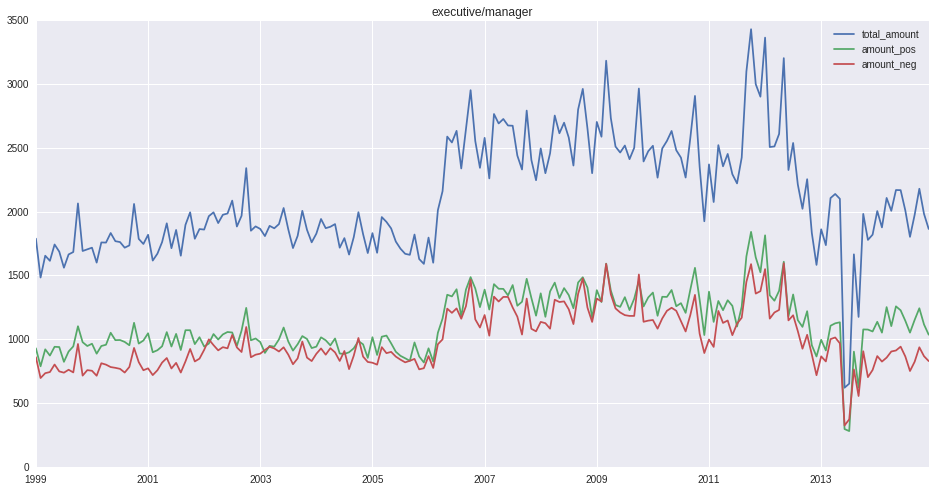

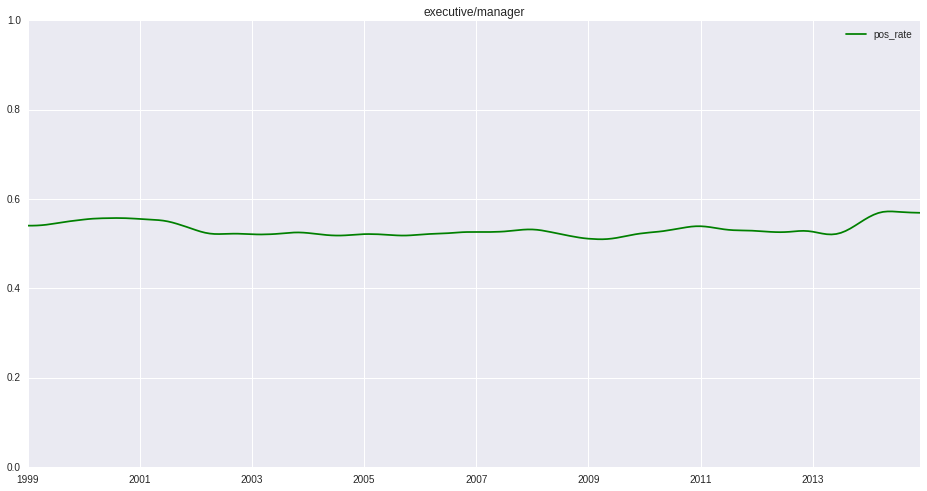

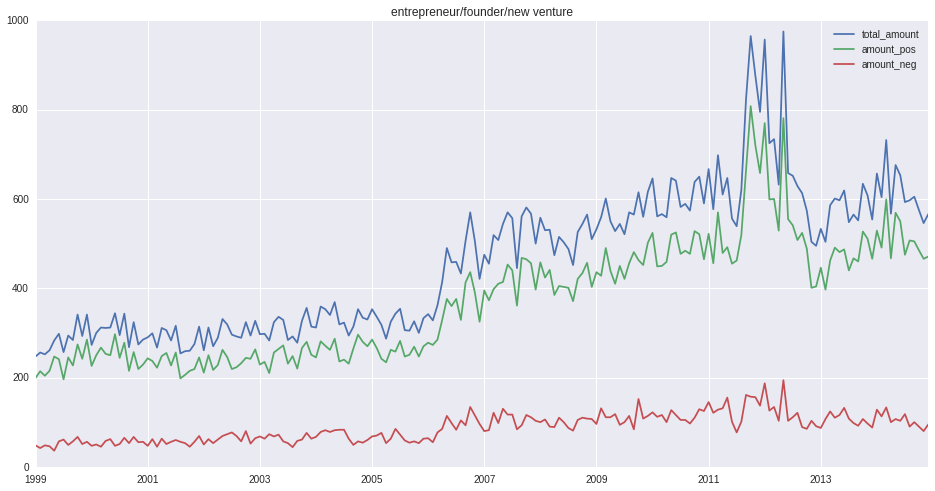

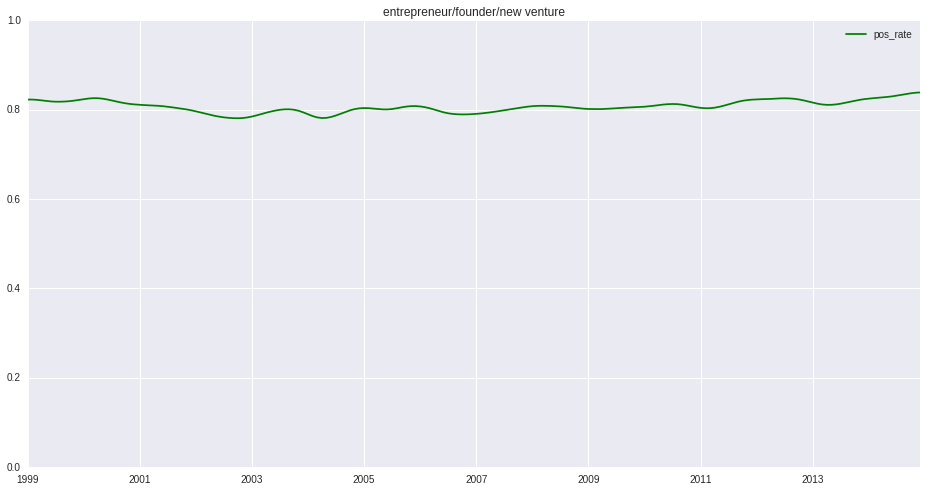

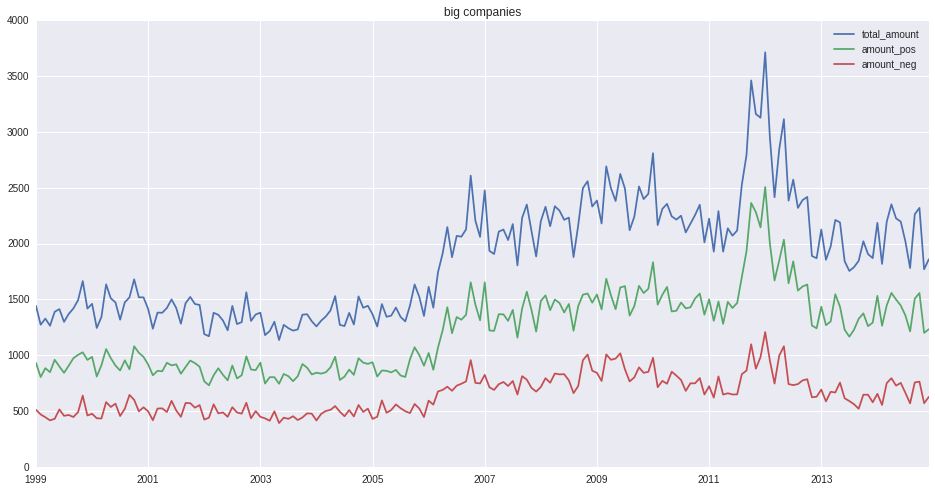

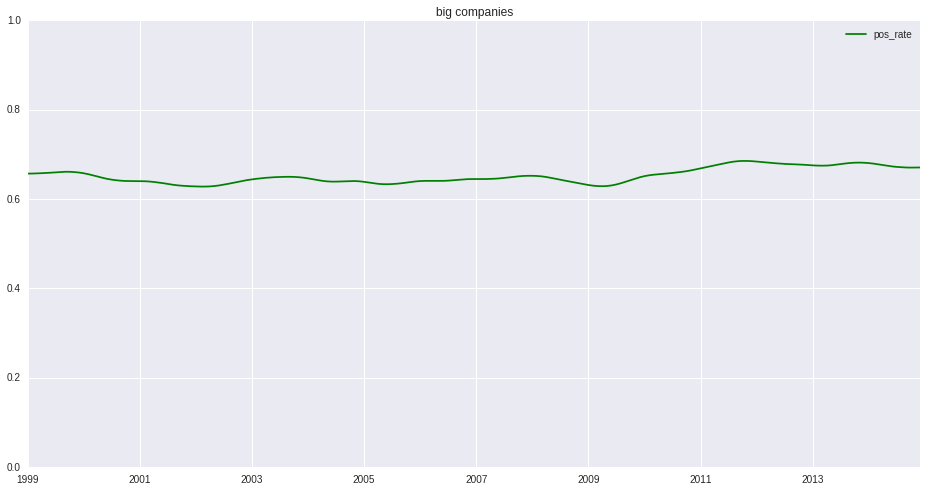

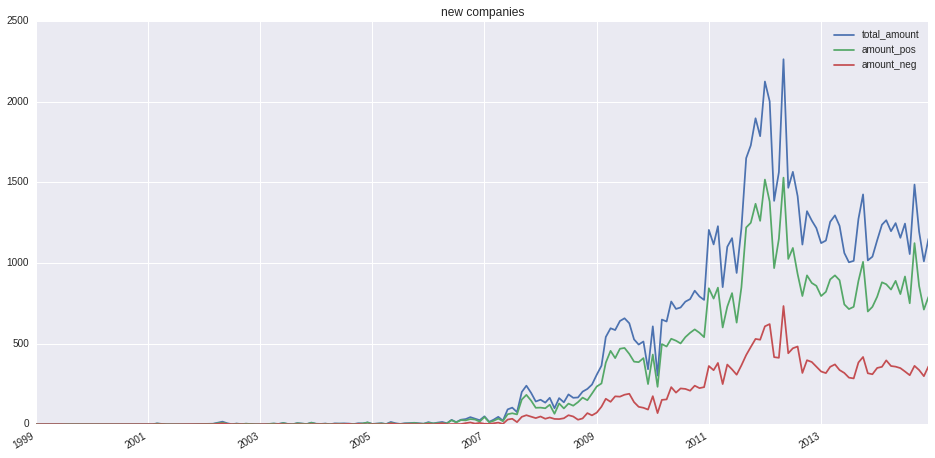

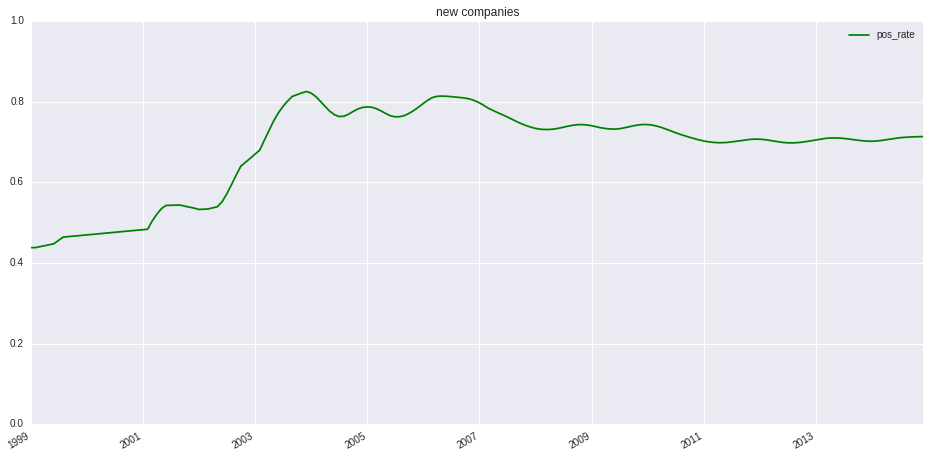

In [277]:
plot(category_list=[11, 12, 2, 3])

### Business vocabulary

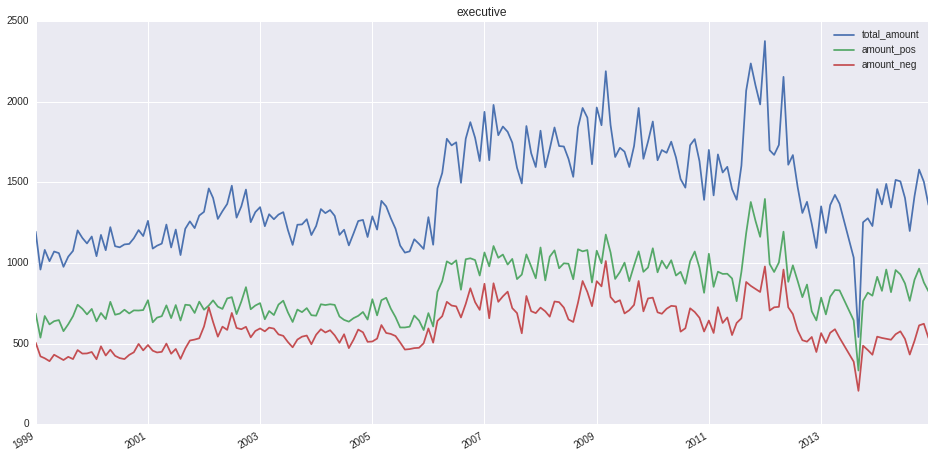

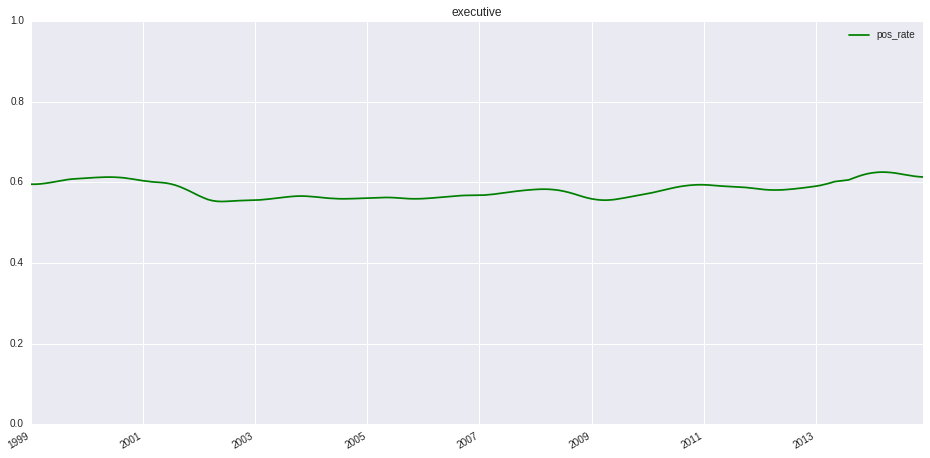

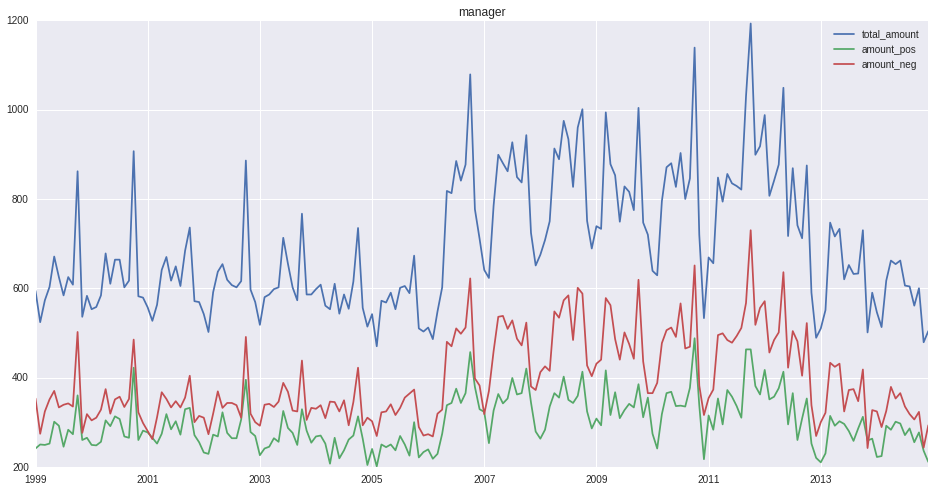

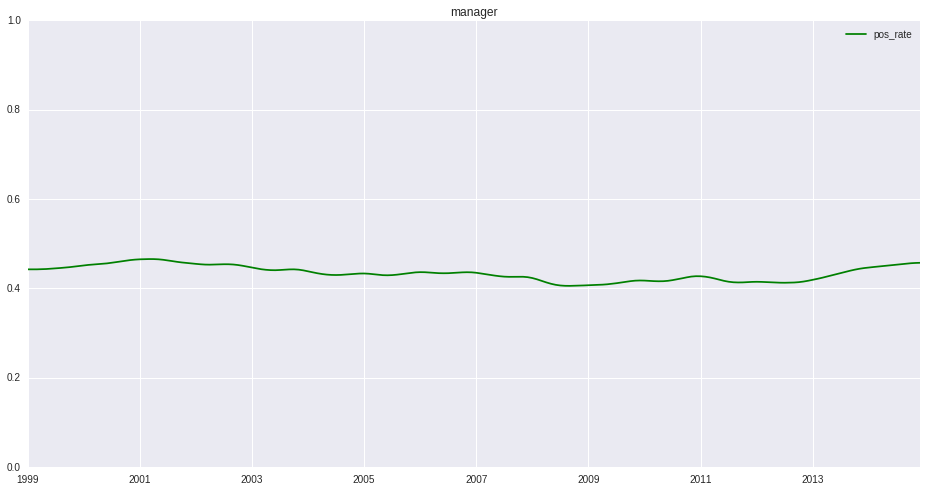

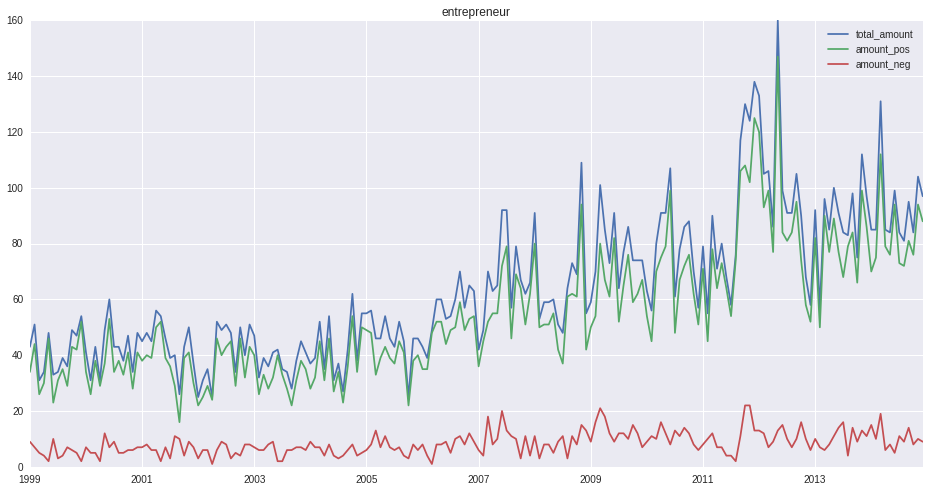

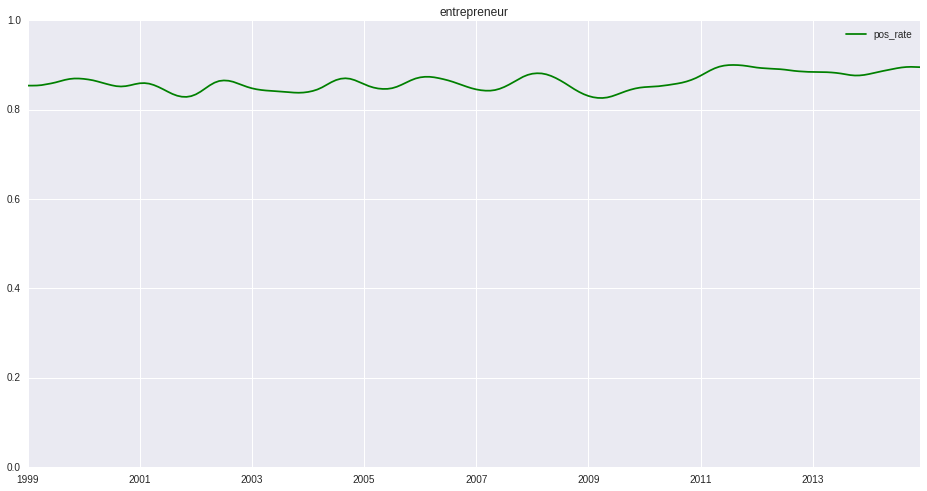

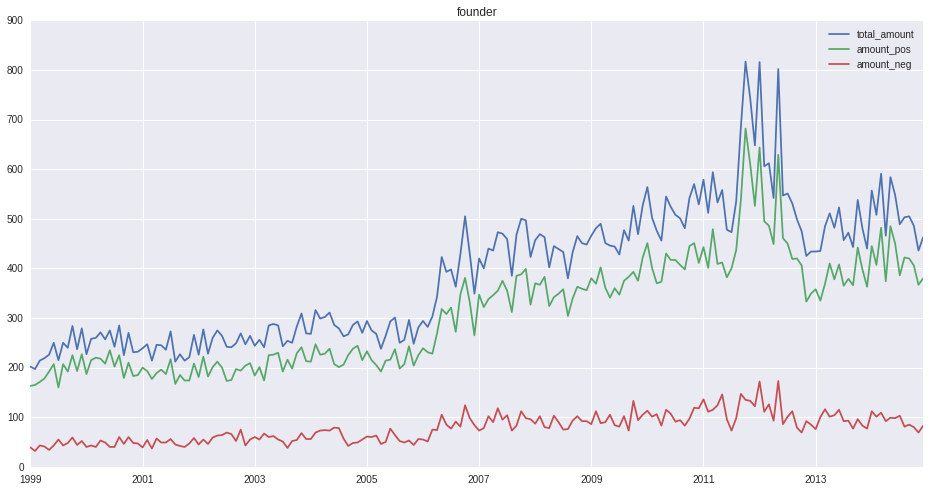

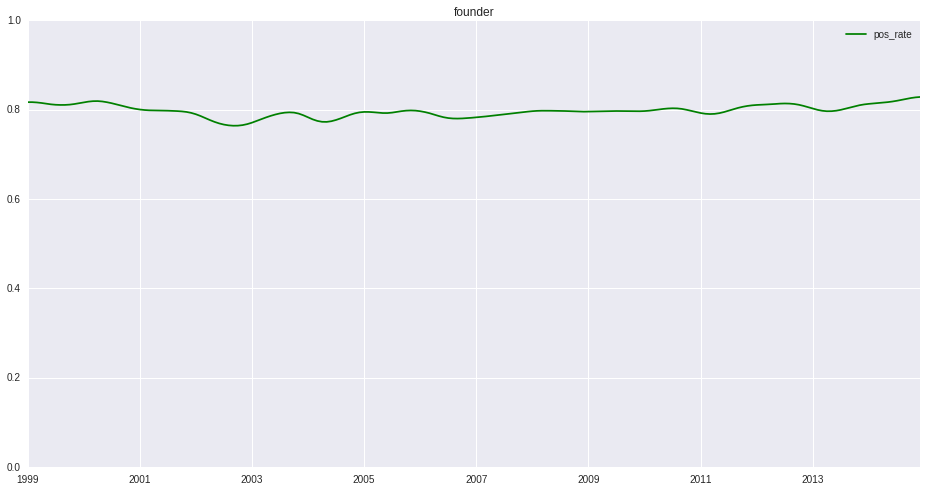

In [278]:
term_list = [
    'executive', 'manager', 'entrepreneur', 'founder'
]
plot(term_list=['executive', 'manager', 'entrepreneur', 'founder'])

### Some big companies

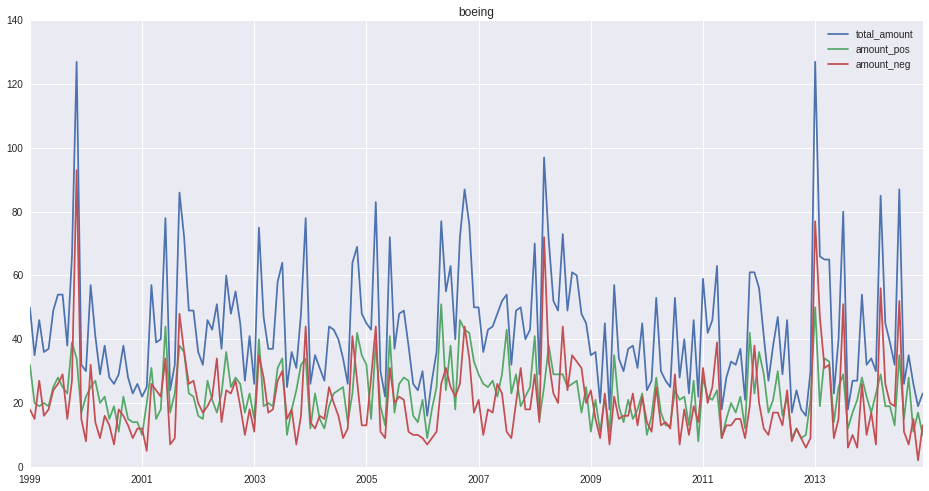

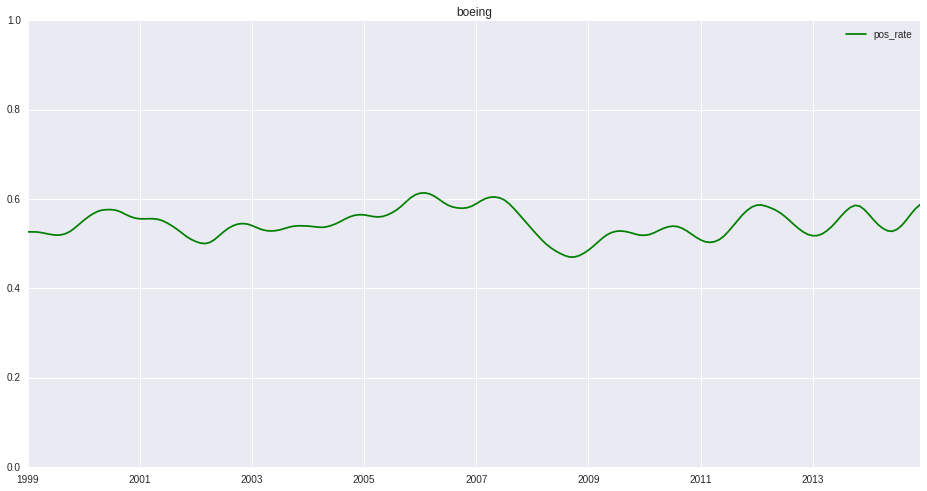

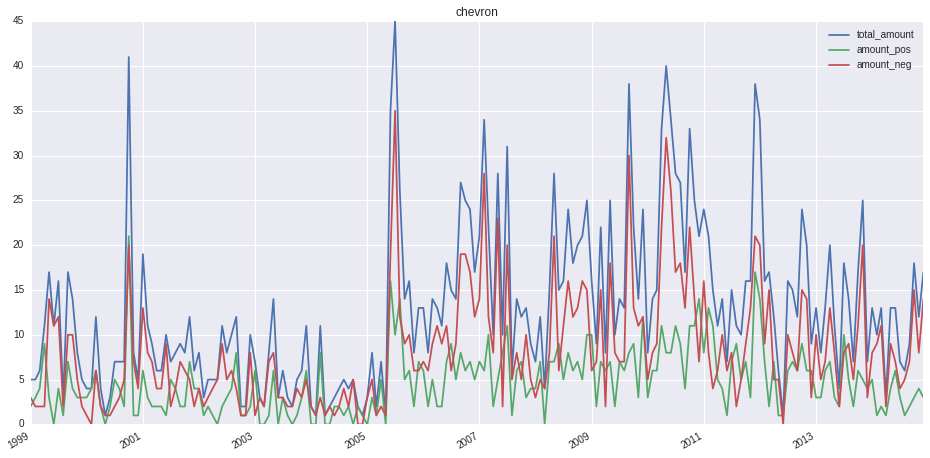

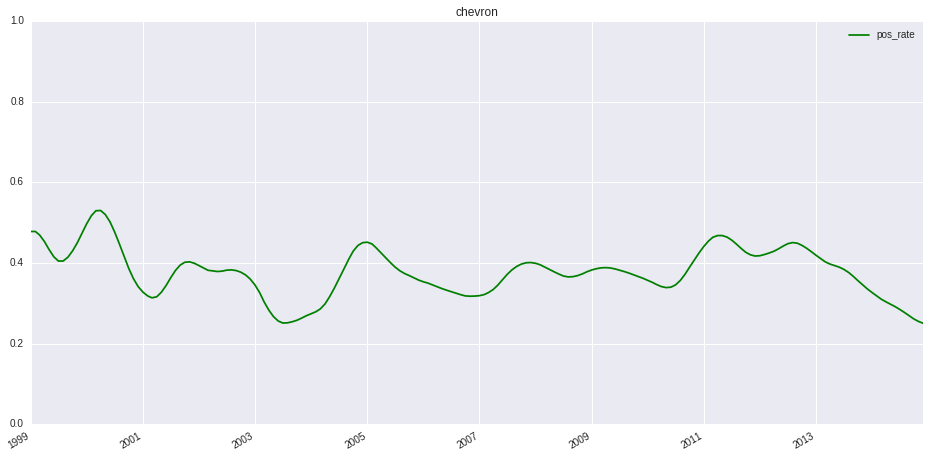

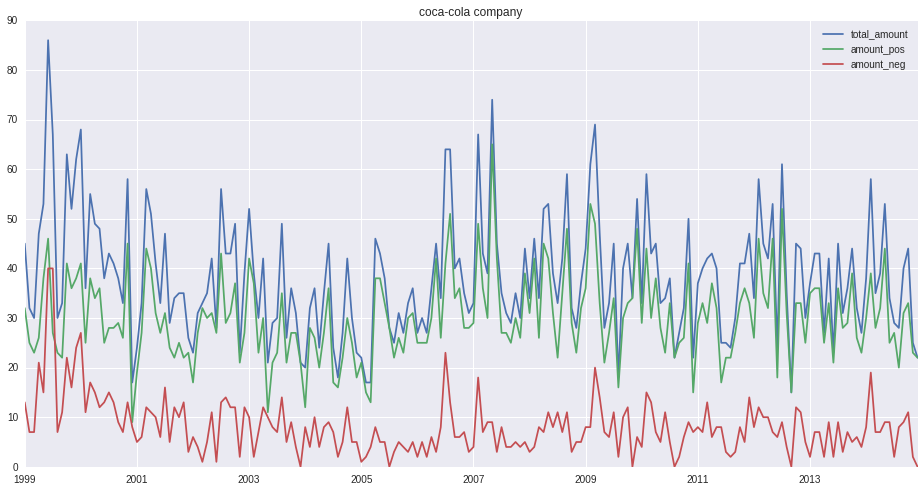

...

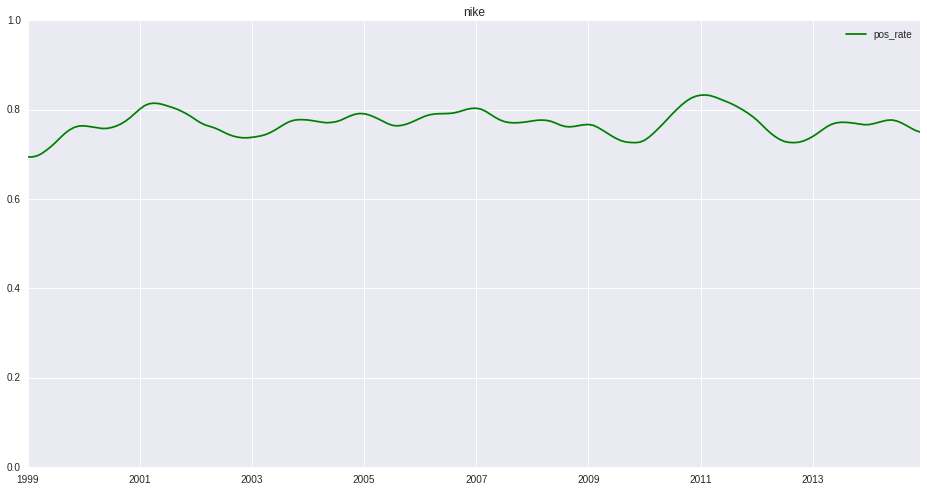

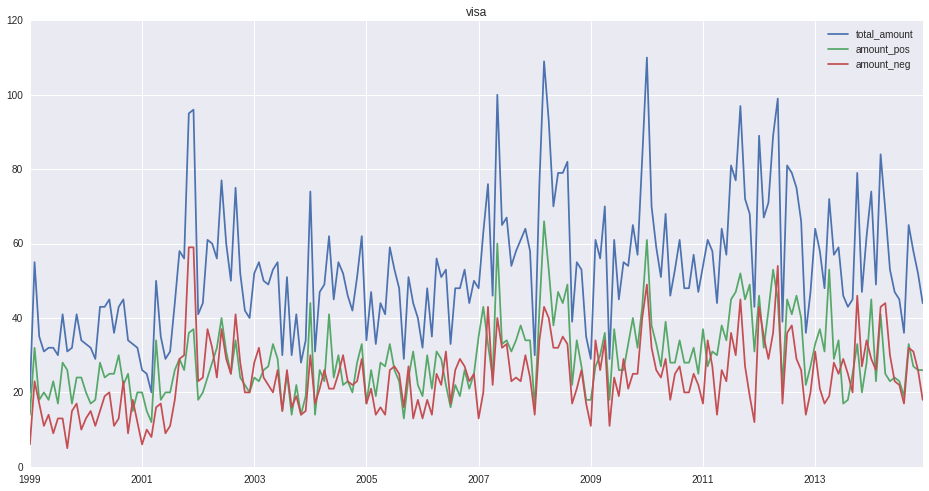

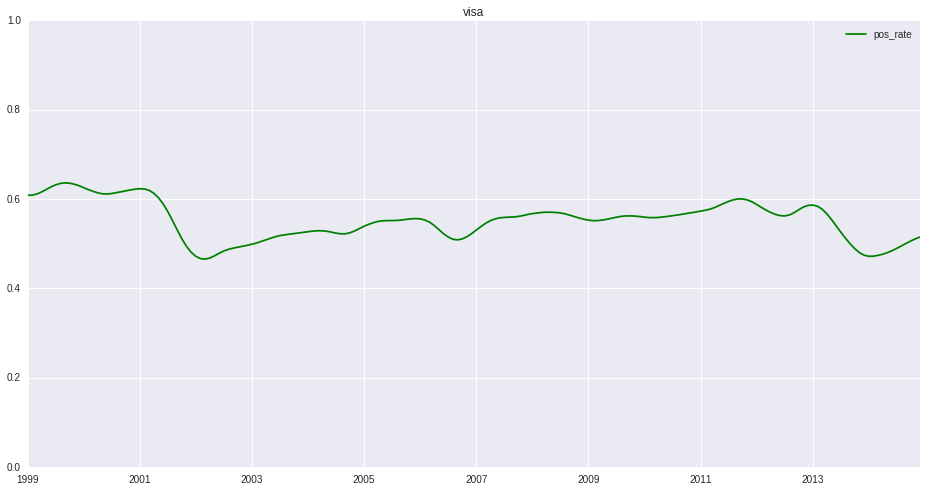

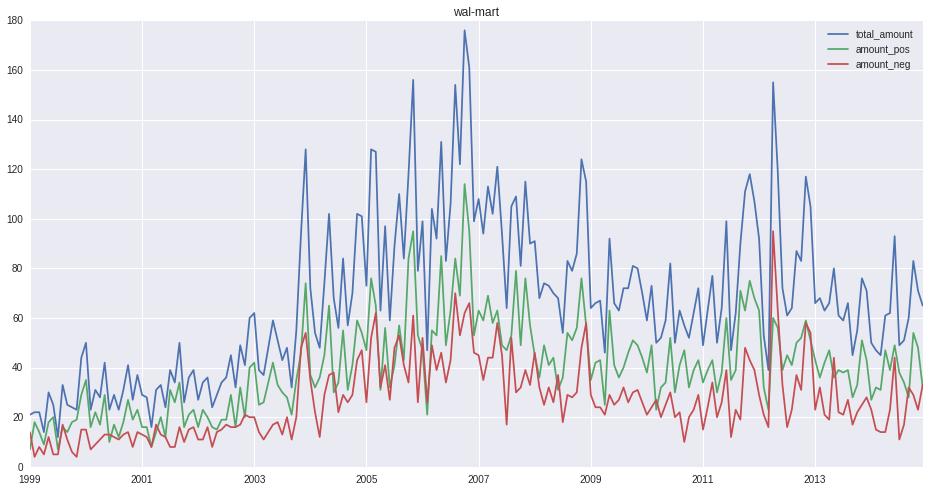

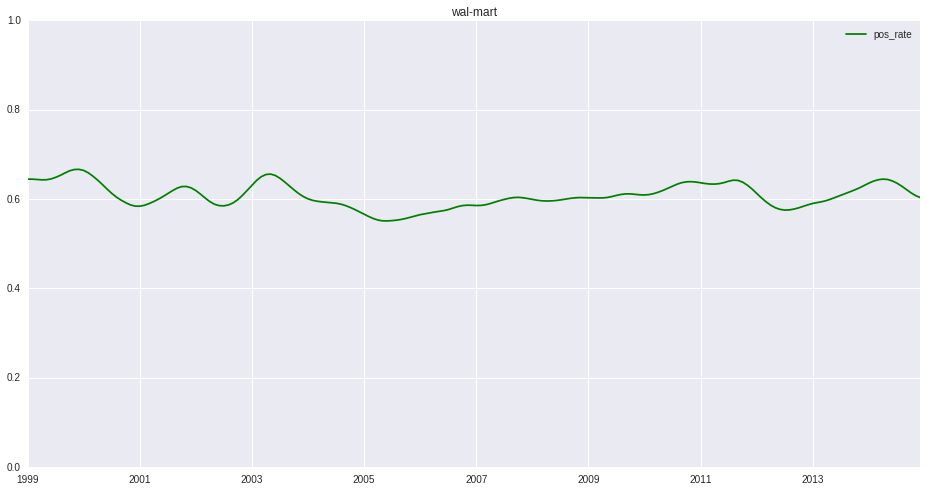

In [279]:
term_list = [
    'boeing', 'chevron', 'coca-cola company', 'dow chemical', 'ford', 'general electric',
    'nike', 'visa', 'wal-mart'
]
plot(term_list=term_list)

TypeError: expected string or buffer

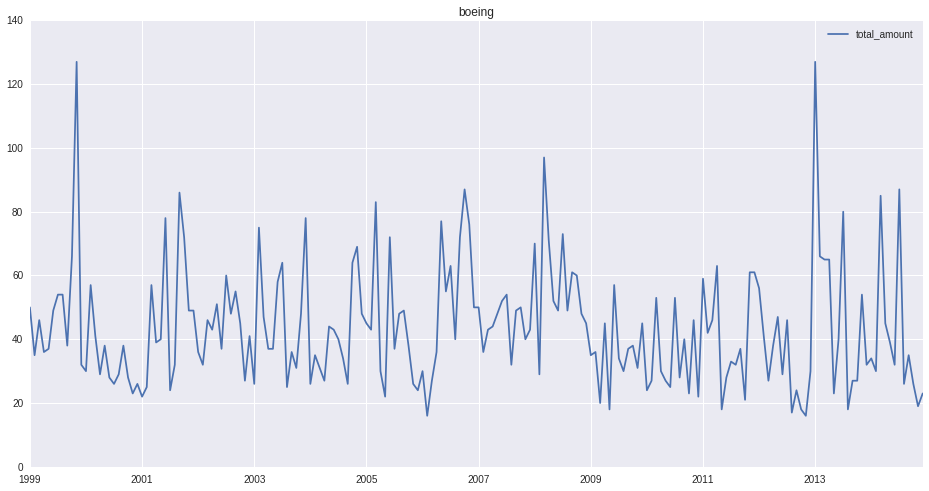

In [285]:
term_list = [
    'boeing', 'chevron', 'coca-cola company', 'dow chemical', 'ford', 'general electric',
    'nike', 'visa', 'wal-mart'
]
plot(term_list=term_list, same=True, info='total')

### New companies

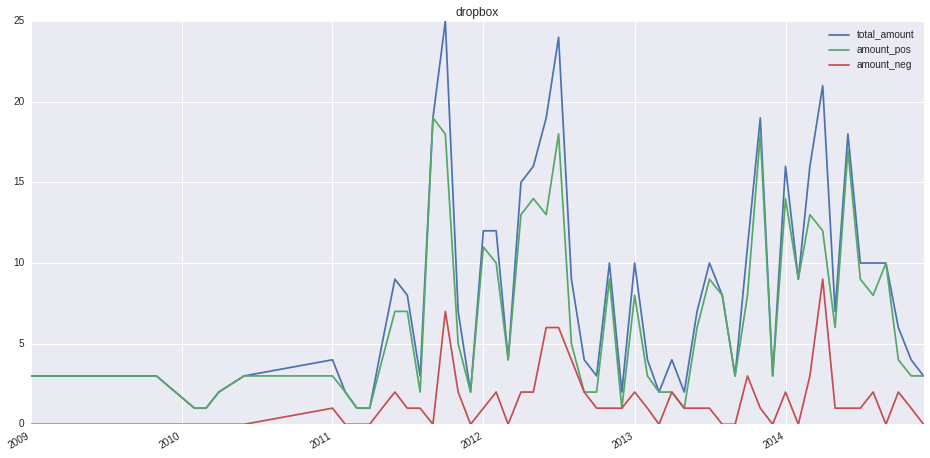

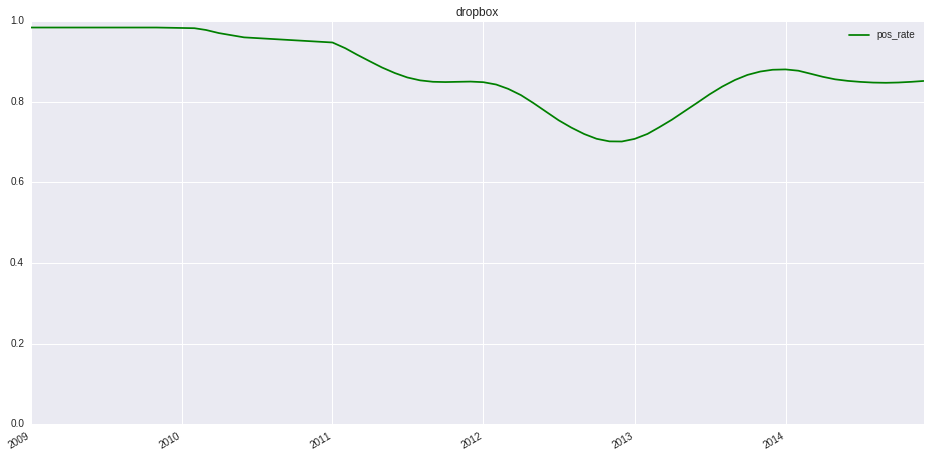

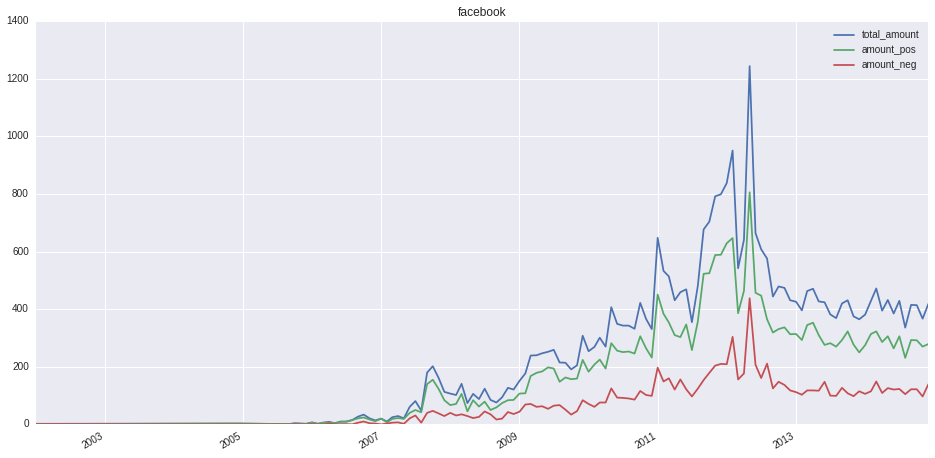

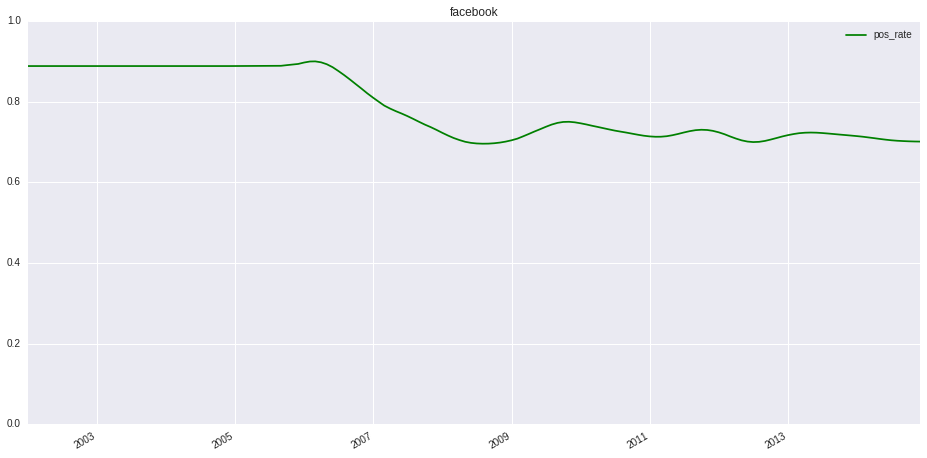

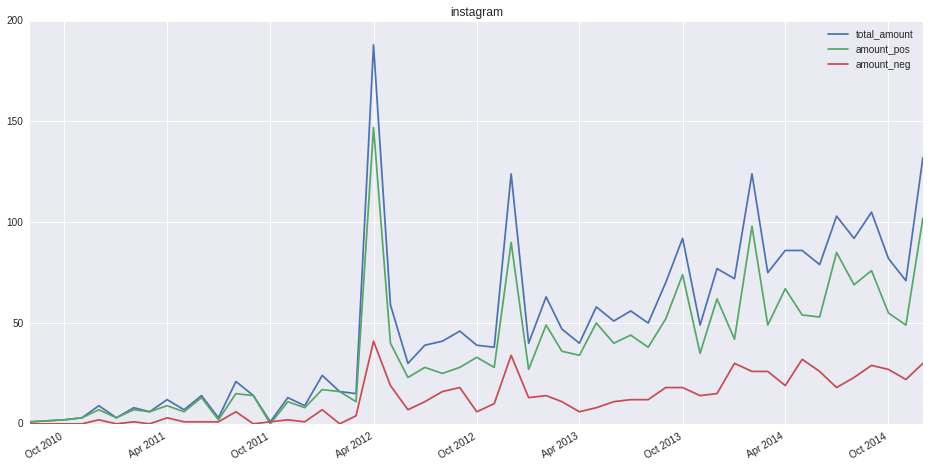

...

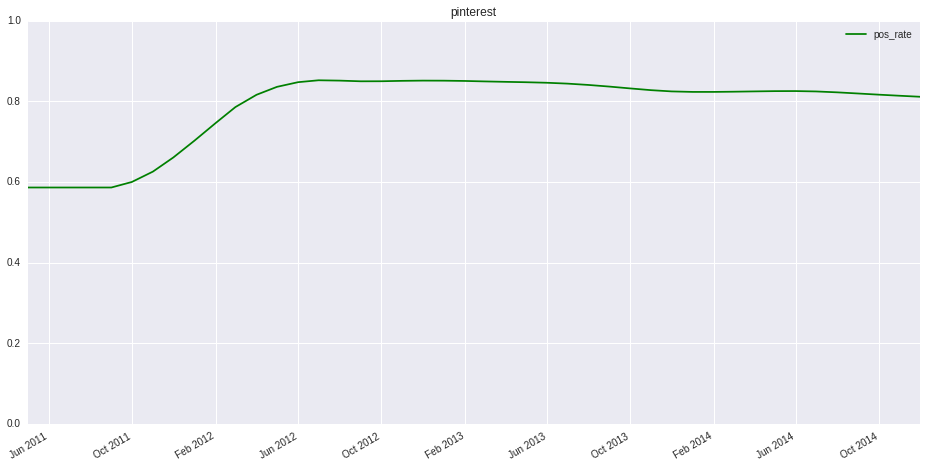

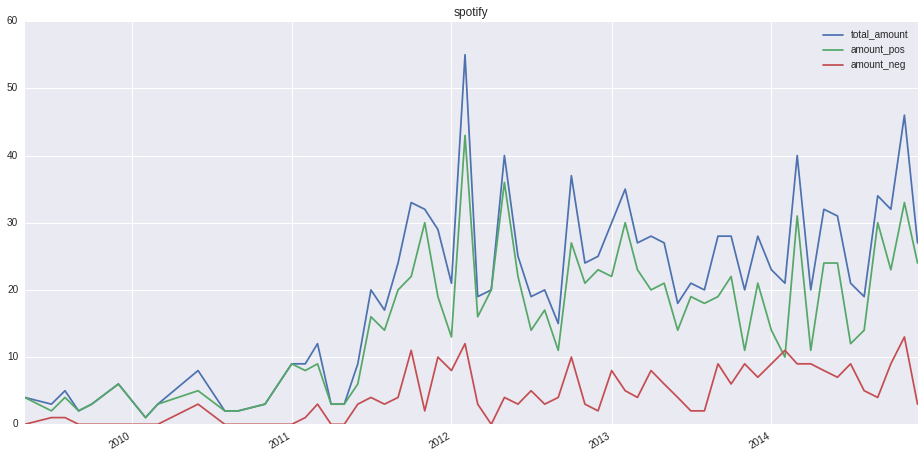

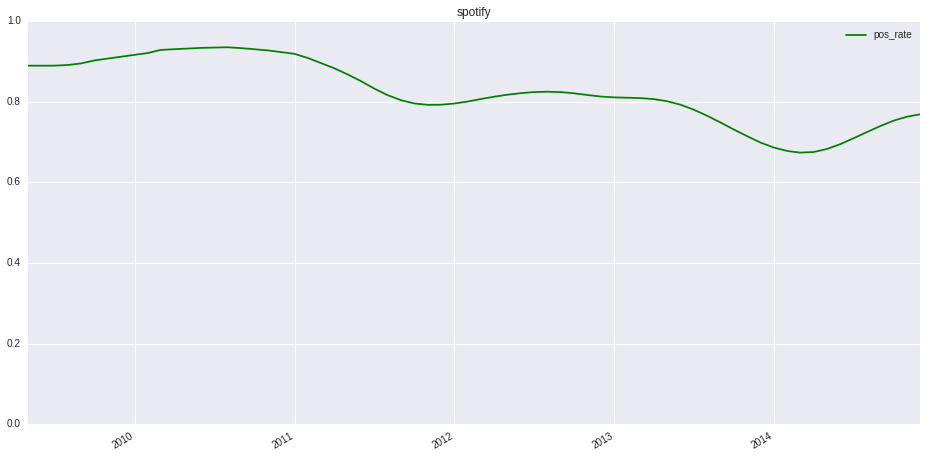

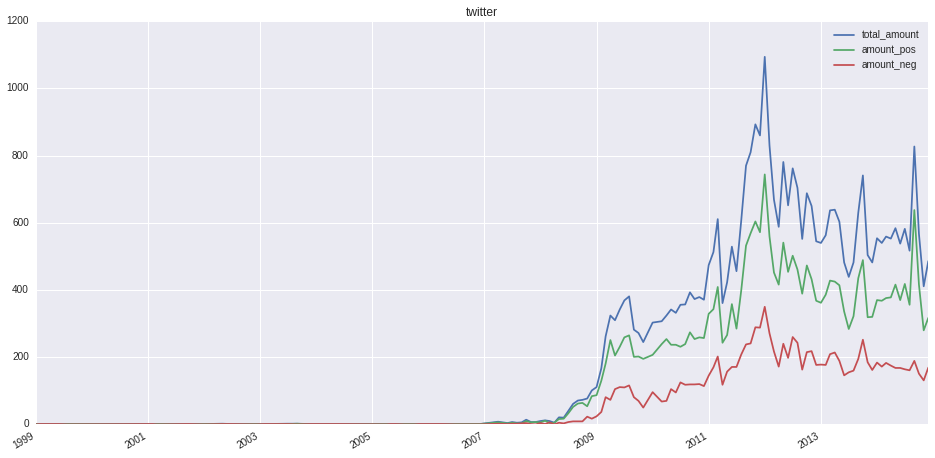

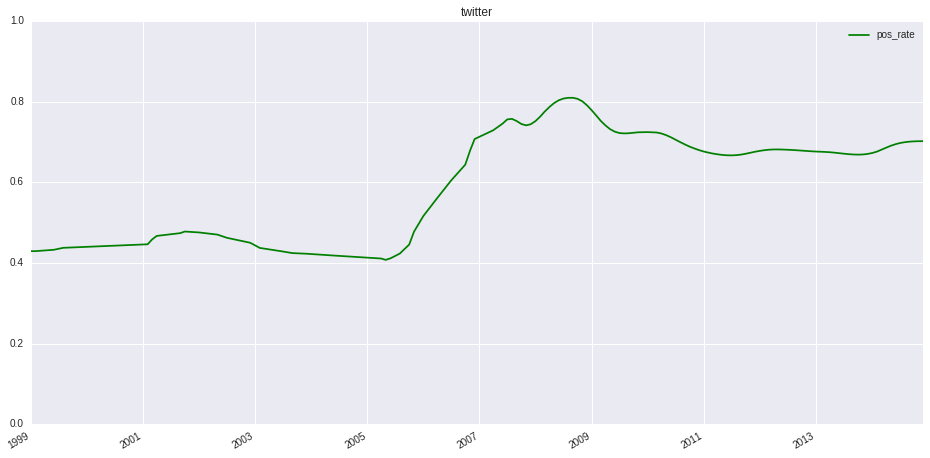

In [280]:
term_list = [
    'dropbox', 'facebook', 'instagram', 'linkedin', 'netflix', 'pinterest', 'spotify', 'twitter'
]
plot(term_list=term_list)

### All big companies

In [281]:
data2.term.count_values()

,term,count
143,executive,273199
168,manager,133558
149,founder,74497
118,apple,38917
148,ford,36835
202,twitter,36776
36,Google,33932
146,facebook,33627
176,microsoft,27287
105,Voices.com,27237


In [282]:
grouped_by_category_and_term = blaze.by(blaze.merge(data2.term_category, data2.term), total=data2.term.count())
grouped_by_term_2 = grouped_by_category_and_term[grouped_by_category_and_term.term_category == 2]
term_2_gt_500 = grouped_by_term_2[grouped_by_term_2.total > 500]

In [283]:
term_2_gt_500.count()

57

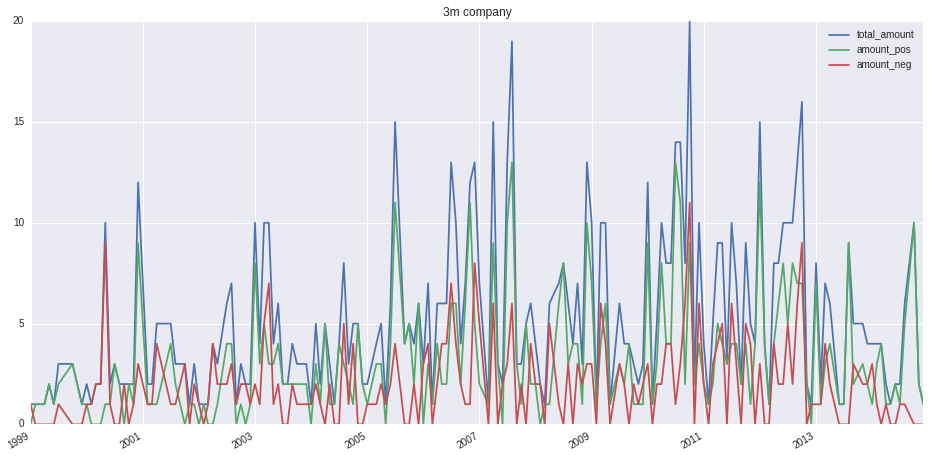

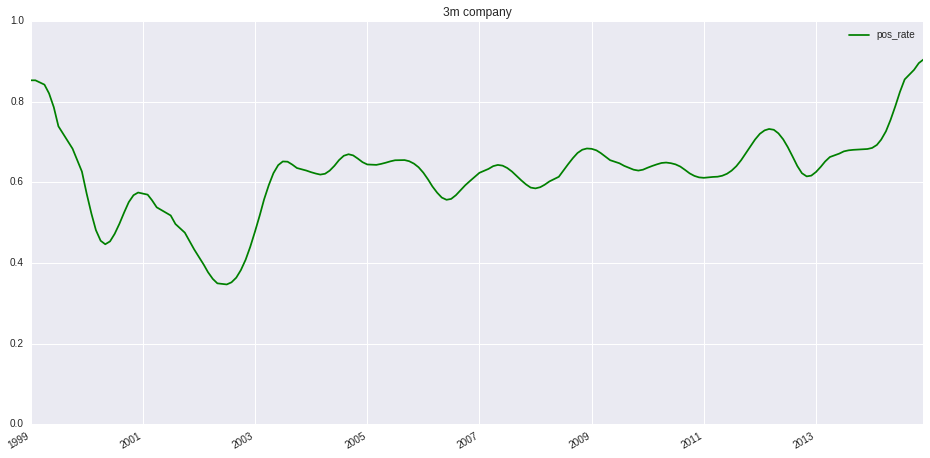

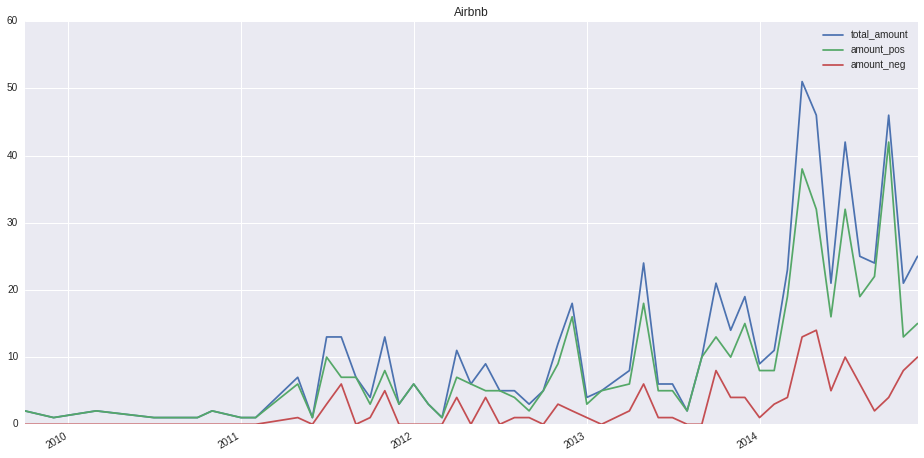

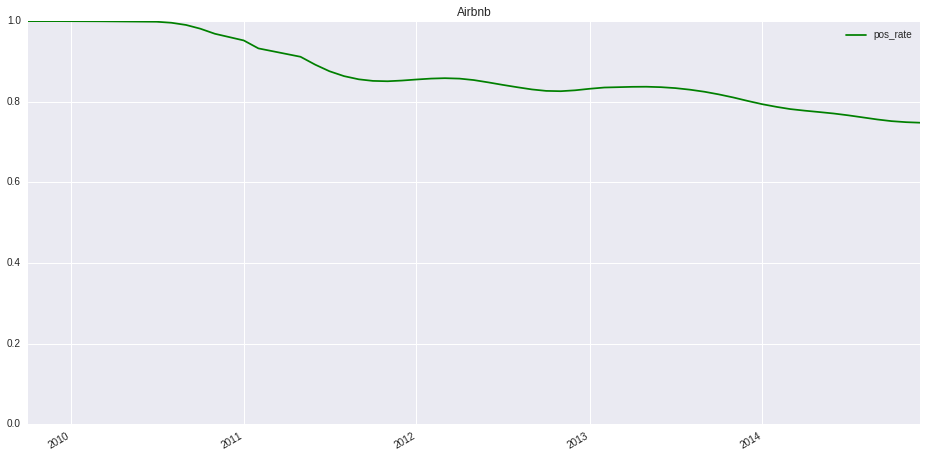

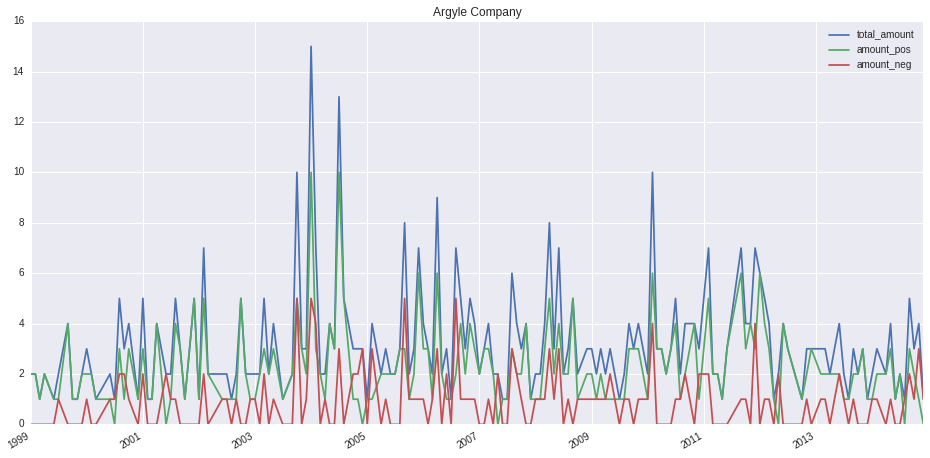

...

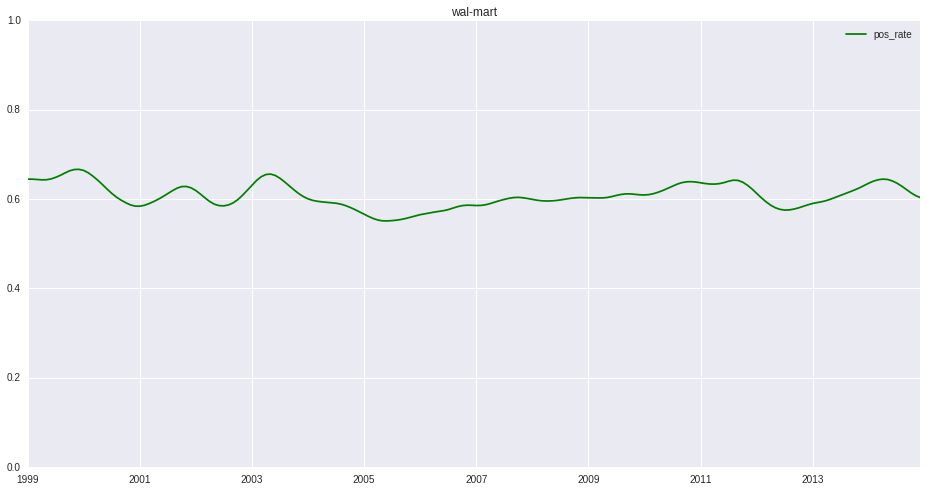

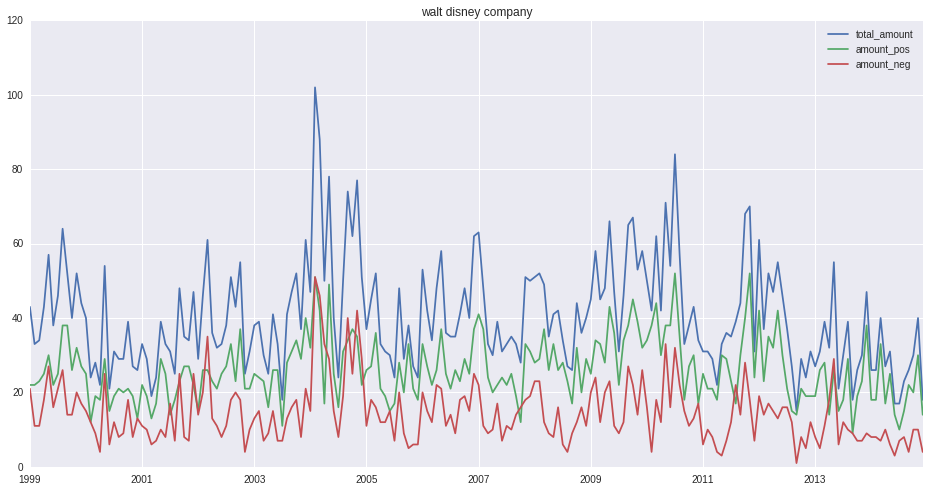

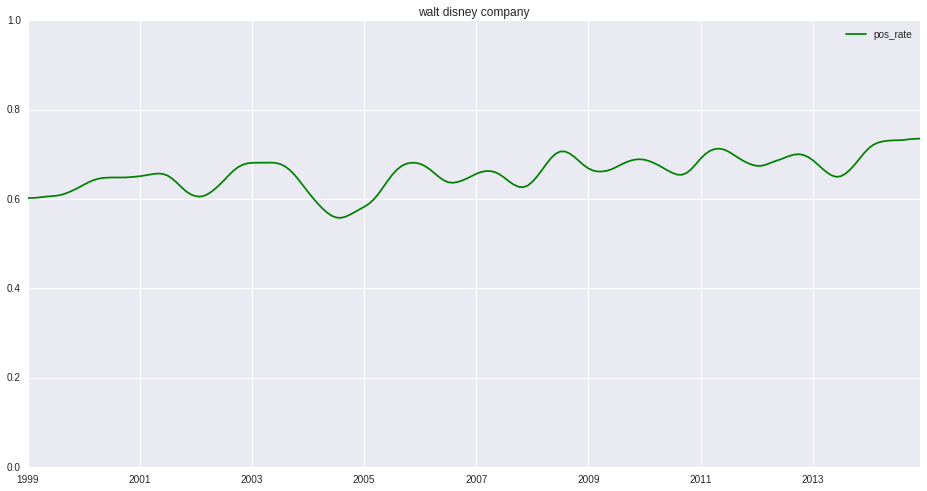

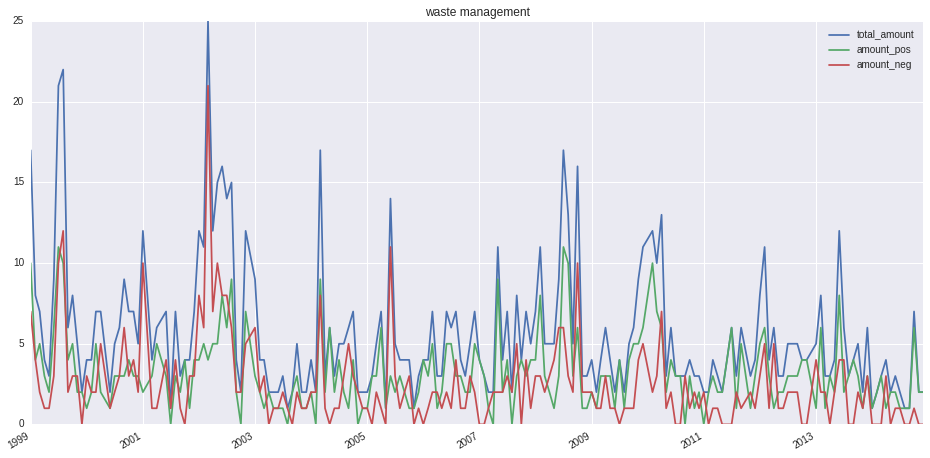

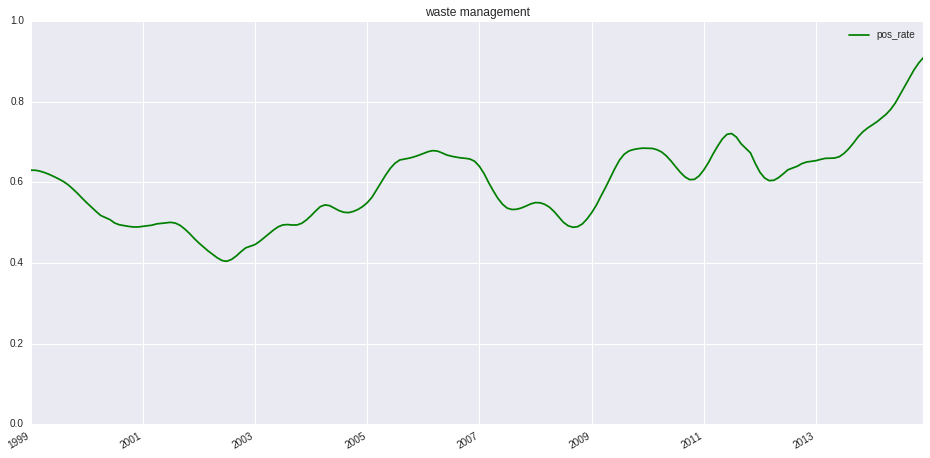

In [284]:
plot(term_list=list(term_2_gt_500.term))

###Multiple terms together

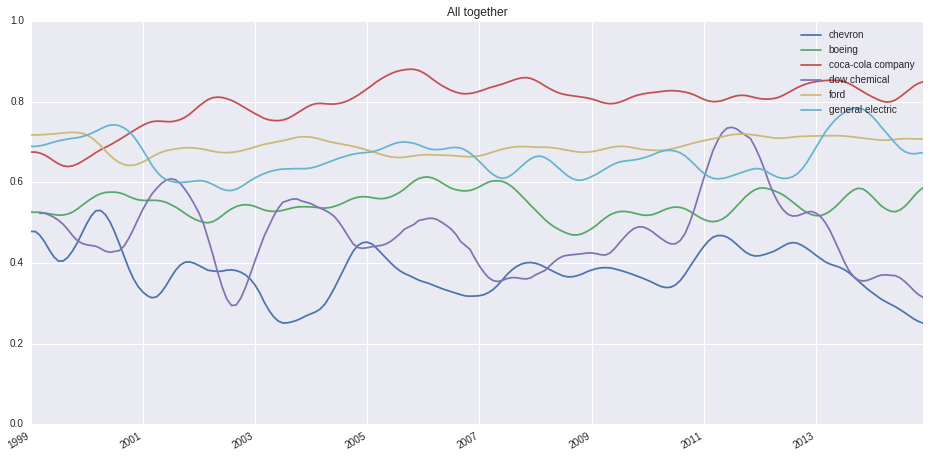

In [307]:
term_list = [
    'chevron', 'boeing', 'coca-cola company', 'dow chemical', 'ford', 'general electric',
#     'nike', 'visa', 'wal-mart'
]
plot(term_list=term_list, same=True, info='pos_rate')